In [1]:
pip install soundfile audioread


Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install noisereduce

In [3]:
pip install librosa matplotlib numpy soundfile audioread

Note: you may need to restart the kernel to use updated packages.


In [70]:
!pip install reportlab

   ---------------------------------------- 1.9/1.9 MB 13.4 MB/s eta 0:00:00


Input Handling: Displays the uploaded file name and the original audio for playback.
Trimming Silence:to remove trailing silence from the audio.
Noise Reduction: "reduce_noise" function applies STFT-based noise reduction using a dynamic threshold.
Band-Pass Filtering:for filtering audio frequencies between 300 Hz and 3000 Hz.
Normalization:librosa.util.normalize ensures audio is scaled to a consistent amplitude range.
Visualization:Detailed comparative graphs are generated, with explanations for each feature
Saving Enhanced Audio:File paths for the enhanced .wav files are displayed.

Raw Audio Shape: (128000,), Sample Rate: 7119


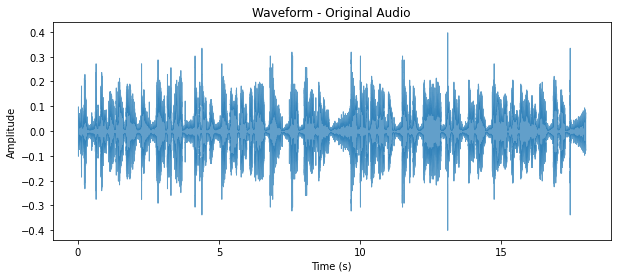

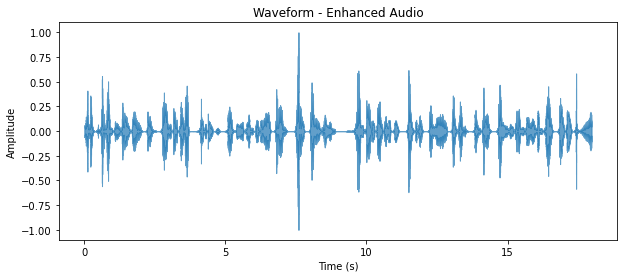

C:\Users\yugesh\anaconda3\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


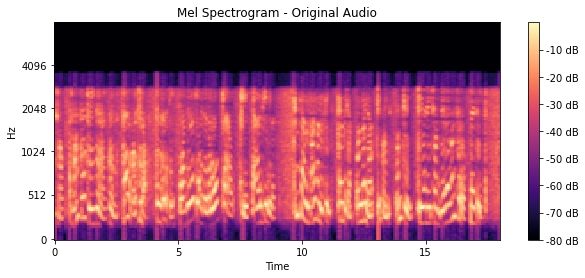

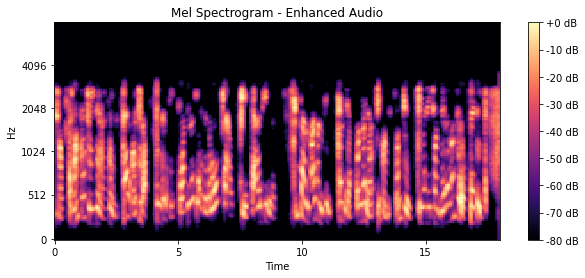

Playing original audio...


Playing enhanced audio...


In [2]:
#audio preprocessing feature 

import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import soundfile as sf
import noisereduce as nr
from scipy.signal import butter, lfilter

# Band-pass filter function
def band_pass_filter(data, lowcut, highcut, fs, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return lfilter(b, a, data)

# Load raw audio
audio_path = 'C:/3RD-YEAR/AIML/test-weatherreport2-[AudioTrimmer.com].wav'
y, sr = librosa.load(audio_path, sr=None)
print(f"Raw Audio Shape: {y.shape}, Sample Rate: {sr}")

# Normalize audio
normalized_audio = librosa.util.normalize(y)

# Apply noise reduction
noise_sample = normalized_audio[:sr * 2]  # 2 seconds of noise sample
denoised_audio = nr.reduce_noise(y=normalized_audio, sr=sr, y_noise=noise_sample)

# Apply band-pass filter to enhance voice
filtered_audio = band_pass_filter(denoised_audio, lowcut=300, highcut=3000, fs=sr)

# Trim leading and trailing silence
trimmed_audio, _ = librosa.effects.trim(filtered_audio)

# Normalize final output
final_audio = librosa.util.normalize(trimmed_audio)

# Save preprocessed audio
preprocessed_audio_path = 'preprocessed_audio_enhanced.wav'
sf.write(preprocessed_audio_path, final_audio, sr)

# Plot waveform of original audio
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.7)
plt.title('Waveform - Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Plot waveform of enhanced audio
plt.figure(figsize=(10, 4))
librosa.display.waveshow(final_audio, sr=sr, alpha=0.7)
plt.title('Waveform - Enhanced Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


# Plot spectrogram of original audio
plt.figure(figsize=(10, 4))
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram - Original Audio')
plt.show()

# Plot spectrogram of enhanced audio
plt.figure(figsize=(10, 4))
S_enhanced = librosa.feature.melspectrogram(y=final_audio, sr=sr, n_mels=128, fmax=8000)
S_enhanced_dB = librosa.power_to_db(S_enhanced, ref=np.max)
librosa.display.specshow(S_enhanced_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram - Enhanced Audio')
plt.show()



# Play original audio
print("Playing original audio...")
display(Audio(data=y, rate=sr))

# Play enhanced audio
print("Playing enhanced audio...")
display(Audio(data=final_audio, rate=sr))
#pakka

Device set to use cpu


FileUpload(value={}, accept='.wav', description='Upload', multiple=True)

Processing file: test-weatherreport2-[AudioTrimmer.com].wav
Playing Original Audio: test-weatherreport2-[AudioTrimmer.com].wav...


Enhanced audio saved as test-weatherreport2-[AudioTrimmer.com]_enhanced.wav.
Playing Enhanced Audio: test-weatherreport2-[AudioTrimmer.com].wav...


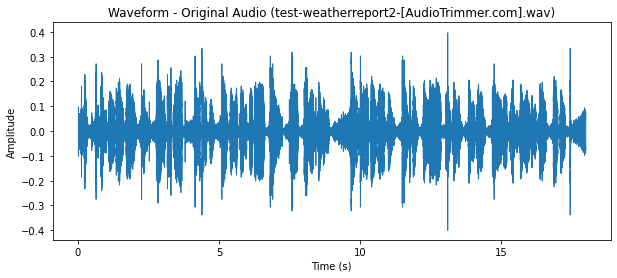

C:\Users\yugesh\anaconda3\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


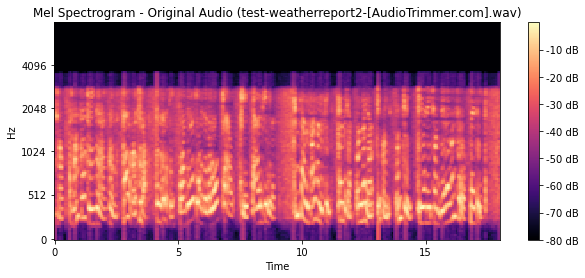

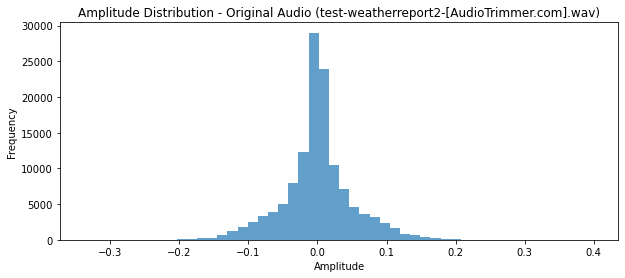

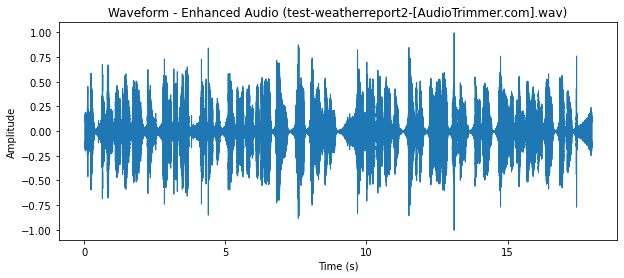

C:\Users\yugesh\anaconda3\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


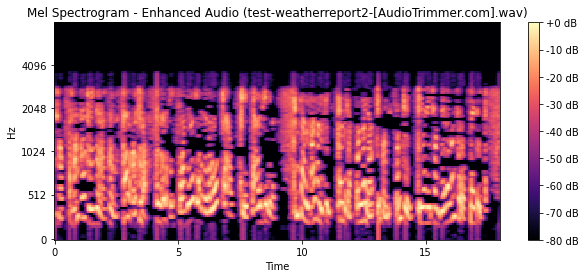

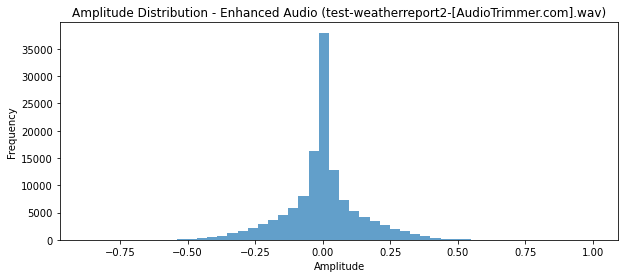

Emotion Analysis Result for test-weatherreport2-[AudioTrimmer.com].wav:
Positive: 0.0071
Negative: 0.0222
Neutral: 0.9707


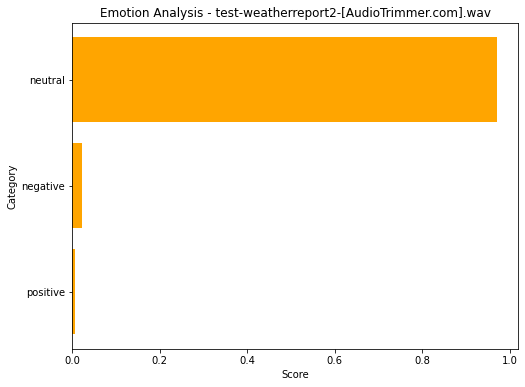

In [5]:
#emotion analysis

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
from transformers import pipeline
from IPython.display import Audio, display
import ipywidgets as widgets
from io import BytesIO


# Noise Reduction Function
def reduce_noise(audio, sr, n_fft=2048, hop_length=512):
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    magnitude, phase = librosa.magphase(stft)
    spectral_magnitude = librosa.amplitude_to_db(np.abs(magnitude), ref=np.max)
    spectral_median = np.median(spectral_magnitude, axis=1, keepdims=True)
    noise_threshold = spectral_median + 5  # Dynamic threshold
    mask = spectral_magnitude > noise_threshold
    reduced_spectral_magnitude = magnitude * mask
    reduced_audio = librosa.istft(reduced_spectral_magnitude * phase, hop_length=hop_length)
    return reduced_audio


# Emotion Analyzer
emotion_analyzer = pipeline('text-classification', model='j-hartmann/emotion-english-distilroberta-base', top_k=None)
emotion_to_category = {
    'joy': 'positive',
    'love': 'positive',
    'optimism': 'positive',
    'anger': 'negative',
    'fear': 'negative',
    'sadness': 'negative',
    'neutral': 'neutral',
    'surprise': 'neutral',  # Map 'surprise' to neutral as it can vary
}


# Function to Process Uploaded Audio Files
def process_uploaded_audio(uploaded_files):
    for file_name, file_content in uploaded_files.items():
        try:
            # Read the uploaded audio file
            y, sr = librosa.load(BytesIO(file_content['content']), sr=None)
            print(f"Processing file: {file_name}")

            # Play Original Audio
            print(f"Playing Original Audio: {file_name}...")
            display(Audio(data=y, rate=sr))

            # Noise Reduction
            enhanced_audio = reduce_noise(y, sr)
            enhanced_audio = librosa.util.normalize(enhanced_audio)

            # Save Enhanced Audio
            preprocessed_audio_path = file_name.replace(".wav", "_enhanced.wav")
            sf.write(preprocessed_audio_path, enhanced_audio, sr)
            print(f"Enhanced audio saved as {preprocessed_audio_path}.")

            # Play Enhanced Audio
            print(f"Playing Enhanced Audio: {file_name}...")
            display(Audio(data=enhanced_audio, rate=sr))

            # Visualizations
            for data, label in [(y, "Original"), (enhanced_audio, "Enhanced")]:
                # Waveform
                plt.figure(figsize=(10, 4))
                librosa.display.waveshow(data, sr=sr)
                plt.title(f'Waveform - {label} Audio ({file_name})')
                plt.xlabel('Time (s)')
                plt.ylabel('Amplitude')
                plt.show()

                # Spectrogram
                plt.figure(figsize=(10, 4))
                S = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=128, fmax=8000)
                S_dB = librosa.power_to_db(S, ref=np.max)
                librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
                plt.colorbar(format='%+2.0f dB')
                plt.title(f'Mel Spectrogram - {label} Audio ({file_name})')
                plt.show()

                # Histogram
                plt.figure(figsize=(10, 4))
                plt.hist(data, bins=50, alpha=0.7)
                plt.title(f'Amplitude Distribution - {label} Audio ({file_name})')
                plt.xlabel('Amplitude')
                plt.ylabel('Frequency')
                plt.show()

            # Emotion Detection
            mfcc = librosa.feature.mfcc(y=enhanced_audio, sr=sr, n_mfcc=13)
            audio_features = np.mean(mfcc, axis=1)
            text_description = f"The audio has the following characteristics: {audio_features.tolist()}"
            emotion_result = emotion_analyzer(text_description)

            # Aggregate Emotion Scores
            category_scores = {'positive': 0.0, 'negative': 0.0, 'neutral': 0.0}
            for emotion in emotion_result[0]:
                category = emotion_to_category.get(emotion['label'], 'neutral')
                category_scores[category] += emotion['score']

            # Normalize Scores
            total_score = sum(category_scores.values())
            if total_score > 0:
                for category in category_scores:
                    category_scores[category] /= total_score

            # Print and Plot Results
            print(f"Emotion Analysis Result for {file_name}:")
            for category, score in category_scores.items():
                print(f"{category.capitalize()}: {score:.4f}")

            plt.figure(figsize=(8, 6))
            plt.barh(list(category_scores.keys()), list(category_scores.values()), color='orange')
            plt.title(f'Emotion Analysis - {file_name}')
            plt.xlabel('Score')
            plt.ylabel('Category')
            plt.show()

        except Exception as e:
            print(f"Error processing {file_name}: {e}")


# Create File Upload Widget
upload_widget = widgets.FileUpload(accept='.wav', multiple=True)
display(upload_widget)


# Process Uploaded Files on Change
def on_upload_change(change):
    if change['new']:
        uploaded_files = {file_name: file for file_name, file in upload_widget.value.items()}
        process_uploaded_audio(uploaded_files)


# Attach Function to Widget
upload_widget.observe(on_upload_change, names='value')

#pakka

FileUpload(value={}, accept='.wav', description='Upload', multiple=True)

Upload detected.
Files uploaded: ['leave-me-to-this-battle-no-reverb.wav']
Processing the following files: dict_keys(['leave-me-to-this-battle-no-reverb.wav'])
Processing file: leave-me-to-this-battle-no-reverb.wav
Playing Original Audio: leave-me-to-this-battle-no-reverb.wav...


Enhanced audio saved as leave-me-to-this-battle-no-reverb_enhanced.wav.
Playing Enhanced Audio: leave-me-to-this-battle-no-reverb.wav...


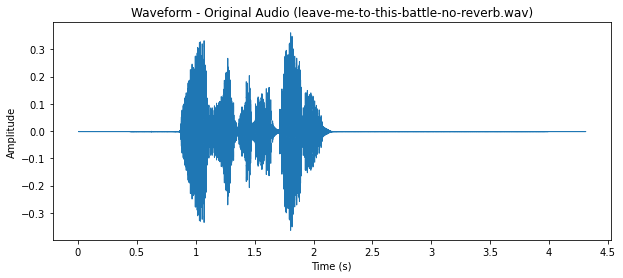

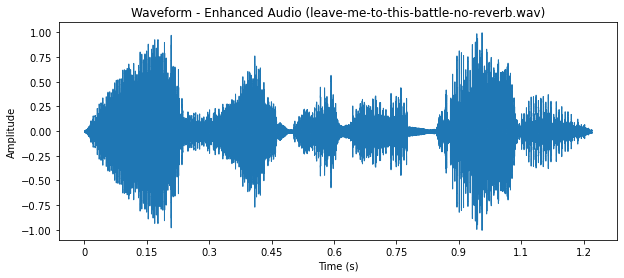

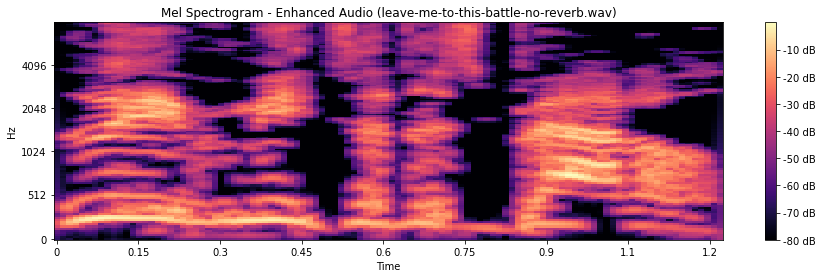

In [7]:
#remove trailing silence

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
from IPython.display import Audio, display
import ipywidgets as widgets
from io import BytesIO

# Noise Reduction Function
def reduce_noise(audio, sr, n_fft=2048, hop_length=512):
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    magnitude, phase = librosa.magphase(stft)
    spectral_magnitude = librosa.amplitude_to_db(np.abs(magnitude), ref=np.max)
    spectral_median = np.median(spectral_magnitude, axis=1, keepdims=True)
    noise_threshold = spectral_median + 5  # Dynamic threshold
    mask = spectral_magnitude > noise_threshold
    reduced_spectral_magnitude = magnitude * mask
    reduced_audio = librosa.istft(reduced_spectral_magnitude * phase, hop_length=hop_length)
    return reduced_audio

# Function to trim trailing silence
def trim_silence(audio, sr, top_db=20):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio

# Function to process uploaded audio files
def process_uploaded_audio(uploaded_files):
    for file_name, file_content in uploaded_files.items():
        # Read the uploaded audio file
        y, sr = librosa.load(BytesIO(file_content['content']), sr=None)
        print(f"Processing file: {file_name}")
        
        # Play Original Audio
        print(f"Playing Original Audio: {file_name}...")
        display(Audio(data=y, rate=sr))
        
        # Remove Trailing Silence
        y_trimmed = trim_silence(y, sr)
        
        # Noise Reduction
        enhanced_audio = reduce_noise(y_trimmed, sr)
        enhanced_audio = librosa.util.normalize(enhanced_audio)
        
        # Save Enhanced Audio
        preprocessed_audio_path = file_name.replace(".wav", "_enhanced.wav")
        sf.write(preprocessed_audio_path, enhanced_audio, sr)
        print(f"Enhanced audio saved as {preprocessed_audio_path}.")
        
        # Play Enhanced Audio
        print(f"Playing Enhanced Audio: {file_name}...")
        display(Audio(data=enhanced_audio, rate=sr))
        
        # Plot Waveform for Original Audio
        plt.figure(figsize=(10, 4))
        librosa.display.waveshow(y, sr=sr)
        plt.title(f'Waveform - Original Audio ({file_name})')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.show()
        
        # Plot Waveform for Enhanced Audio
        plt.figure(figsize=(10, 4))
        librosa.display.waveshow(enhanced_audio, sr=sr)
        plt.title(f'Waveform - Enhanced Audio ({file_name})')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.show()
        
        # Plot Spectrogram for Enhanced Audio
        plt.figure(figsize=(15, 4))
        S_enhanced = librosa.feature.melspectrogram(y=enhanced_audio, sr=sr, n_mels=128, fmax=8000)
        S_enhanced_dB = librosa.power_to_db(S_enhanced, ref=np.max)
        librosa.display.specshow(S_enhanced_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Mel Spectrogram - Enhanced Audio ({file_name})')
        plt.show()

# Create file upload widget
upload_widget = widgets.FileUpload(accept='.wav', multiple=True)

# Display the upload widget
display(upload_widget)

# Process the uploaded files when the user uploads them
def on_upload_change(change):
    print("Upload detected.")
    if change['new']:
        print(f"Files uploaded: {list(upload_widget.value.keys())}")
        uploaded_files = {file_name: file for file_name, file in upload_widget.value.items()}
        print(f"Processing the following files: {uploaded_files.keys()}")
        process_uploaded_audio(uploaded_files)


# Attach the function to the widget
upload_widget.observe(on_upload_change, names='value')

#pakka

FileUpload(value={}, accept='.wav', description='Upload', multiple=True)

Processing file: test2-[AudioTrimmer.com].mp3
Playing Original Audio: test2-[AudioTrimmer.com].mp3...


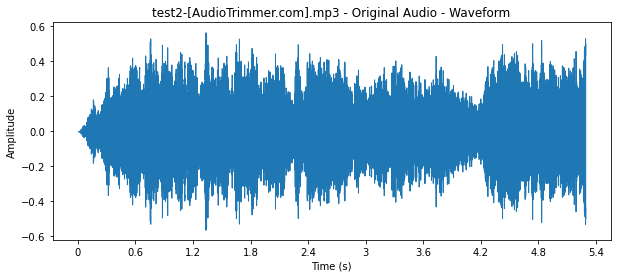

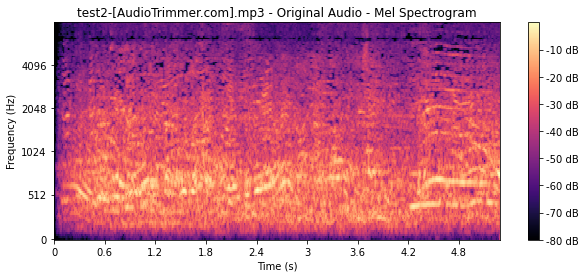

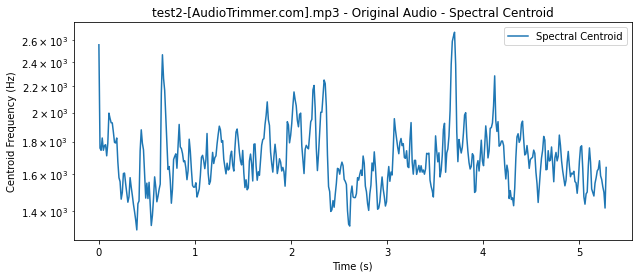

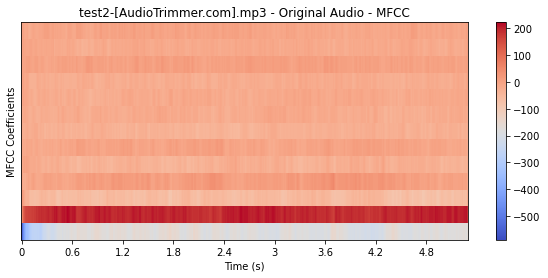

Enhanced audio saved as test2-[AudioTrimmer.com].mp3.
Playing Enhanced Audio: test2-[AudioTrimmer.com].mp3...


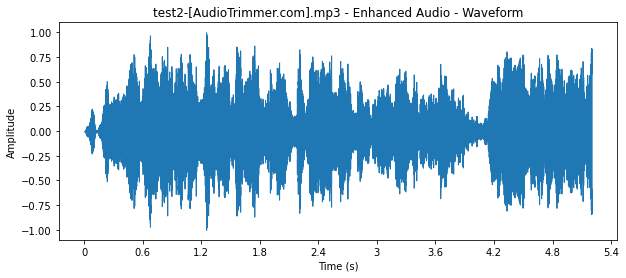

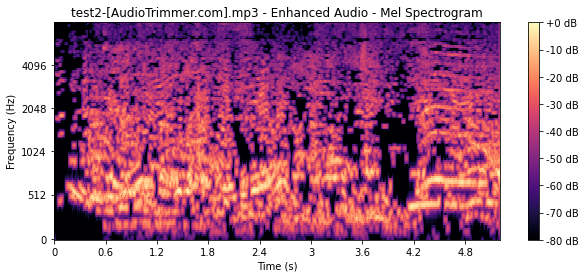

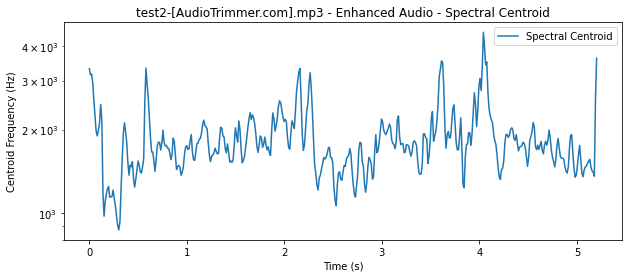

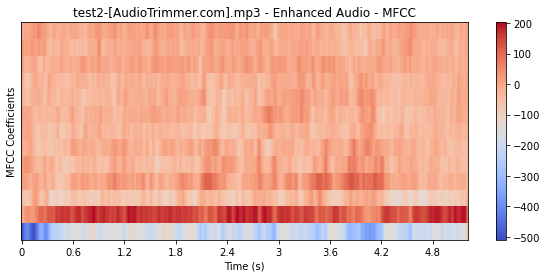

In [8]:
#mp3 files 

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
from IPython.display import Audio, display
import ipywidgets as widgets
from io import BytesIO

# Noise Reduction Function
def reduce_noise(audio, sr, n_fft=2048, hop_length=512):
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    magnitude, phase = librosa.magphase(stft)
    spectral_magnitude = librosa.amplitude_to_db(np.abs(magnitude), ref=np.max)
    spectral_median = np.median(spectral_magnitude, axis=1, keepdims=True)
    noise_threshold = spectral_median + 5  # Dynamic threshold
    mask = spectral_magnitude > noise_threshold
    reduced_spectral_magnitude = magnitude * mask
    reduced_audio = librosa.istft(reduced_spectral_magnitude * phase, hop_length=hop_length)
    return reduced_audio

# Function to trim trailing silence
def trim_silence(audio, sr, top_db=20):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio

# Function to plot audio features
def plot_audio_features(audio, sr, title_prefix):
    plt.figure(figsize=(10, 4))
    # Waveform
    librosa.display.waveshow(audio, sr=sr)
    plt.title(f'{title_prefix} - Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()

    # Mel Spectrogram
    plt.figure(figsize=(10, 4))
    mel_spec = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128, fmax=8000)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    librosa.display.specshow(mel_spec_db, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{title_prefix} - Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.show()

    # Spectral Centroid
    plt.figure(figsize=(10, 4))
    spectral_centroids = librosa.feature.spectral_centroid(y=audio, sr=sr)[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames, sr=sr)
    plt.semilogy(t, spectral_centroids, label='Spectral Centroid')
    plt.title(f'{title_prefix} - Spectral Centroid')
    plt.xlabel('Time (s)')
    plt.ylabel('Centroid Frequency (Hz)')
    plt.legend()
    plt.show()

    # MFCC (Mel-Frequency Cepstral Coefficients)
    plt.figure(figsize=(10, 4))
    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfcc, x_axis='time', sr=sr)
    plt.colorbar()
    plt.title(f'{title_prefix} - MFCC')
    plt.xlabel('Time (s)')
    plt.ylabel('MFCC Coefficients')
    plt.show()

# Function to process uploaded audio files
def process_uploaded_audio(uploaded_files):
    for file_name, file_content in uploaded_files.items():
        # Read the uploaded audio file
        y, sr = librosa.load(BytesIO(file_content['content']), sr=None)
        print(f"Processing file: {file_name}")
        
        # Play Original Audio
        print(f"Playing Original Audio: {file_name}...")
        display(Audio(data=y, rate=sr))
        
        # Visualize Original Audio Features
        plot_audio_features(y, sr, title_prefix=f'{file_name} - Original Audio')
        
        # Remove Trailing Silence
        y_trimmed = trim_silence(y, sr)
        
        # Noise Reduction
        enhanced_audio = reduce_noise(y_trimmed, sr)
        enhanced_audio = librosa.util.normalize(enhanced_audio)
        
        # Save Enhanced Audio
        preprocessed_audio_path = file_name.replace(".wav", "_enhanced.wav")
        sf.write(preprocessed_audio_path, enhanced_audio, sr)
        print(f"Enhanced audio saved as {preprocessed_audio_path}.")
        
        # Play Enhanced Audio
        print(f"Playing Enhanced Audio: {file_name}...")
        display(Audio(data=enhanced_audio, rate=sr))
        
        # Visualize Enhanced Audio Features
        plot_audio_features(enhanced_audio, sr, title_prefix=f'{file_name} - Enhanced Audio')

# Create file upload widget
upload_widget = widgets.FileUpload(accept='.wav', multiple=True)

# Display the upload widget
display(upload_widget)

# Process the uploaded files when the user uploads them
def on_upload_change(change):
    if change['new']:
        uploaded_files = {file_name: file for file_name, file in upload_widget.value.items()}
        process_uploaded_audio(uploaded_files)

# Attach the function to the widget
upload_widget.observe(on_upload_change, names='value')


FileUpload(value={}, accept='.wav', description='Upload', multiple=True)

Processing file: anouncement-parking-lot-[AudioTrimmer.com].wav


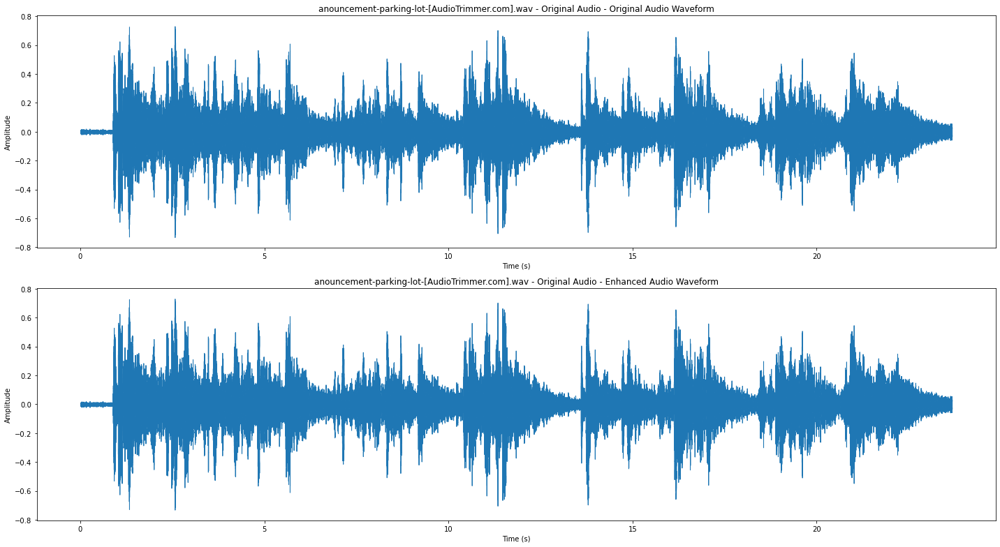

Waveform: This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.


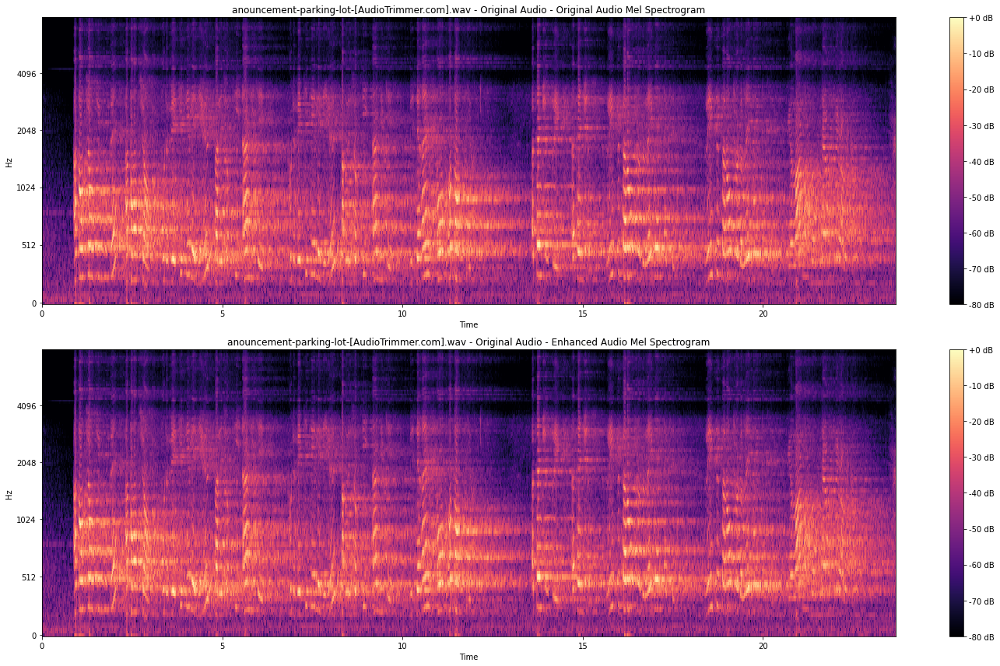

Mel Spectrogram: This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.


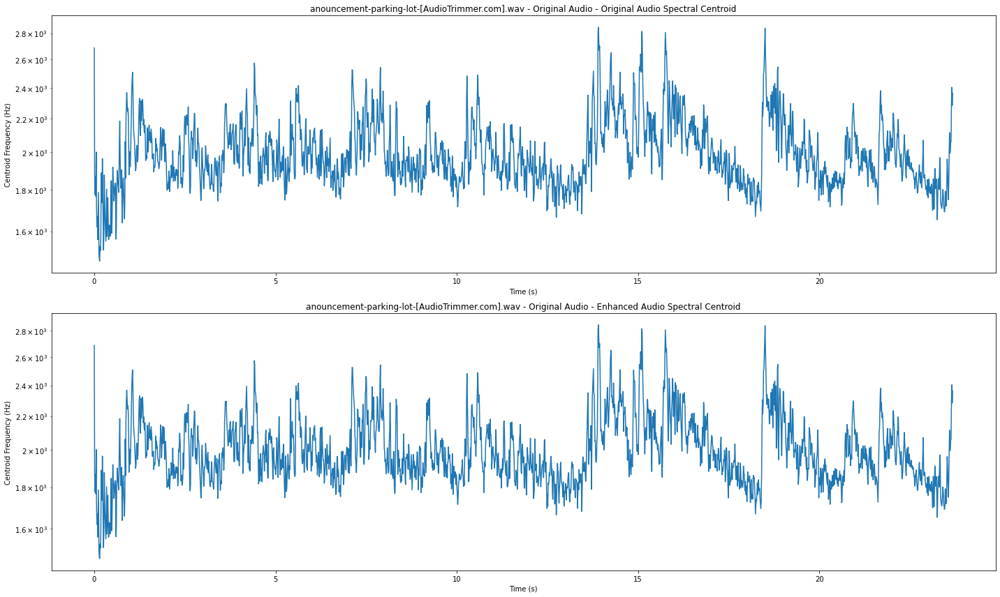

Spectral Centroid: The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.


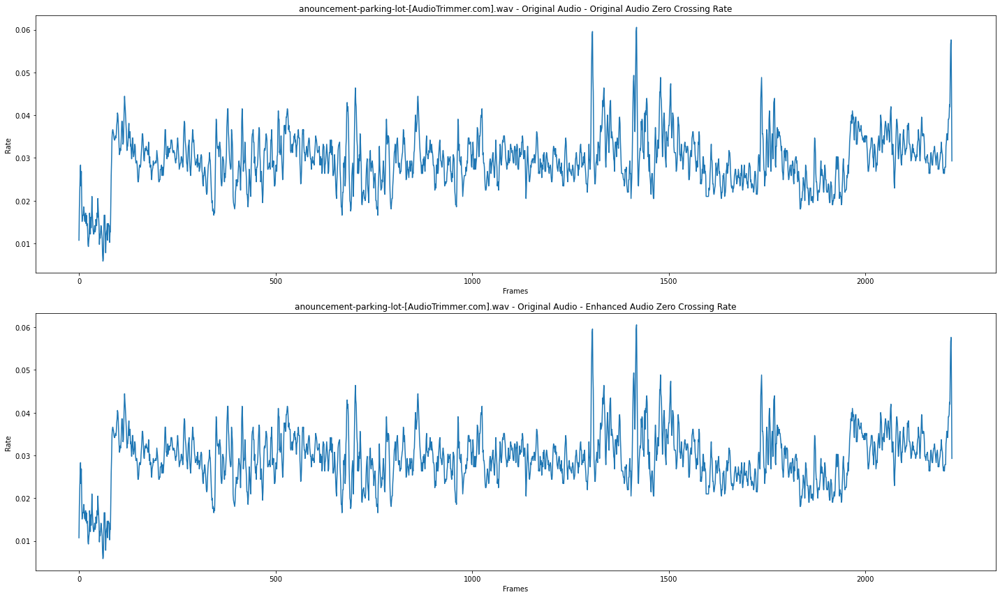

Zero Crossing Rate: This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.
Enhanced audio saved as anouncement-parking-lot-[AudioTrimmer.com]_enhanced.wav.


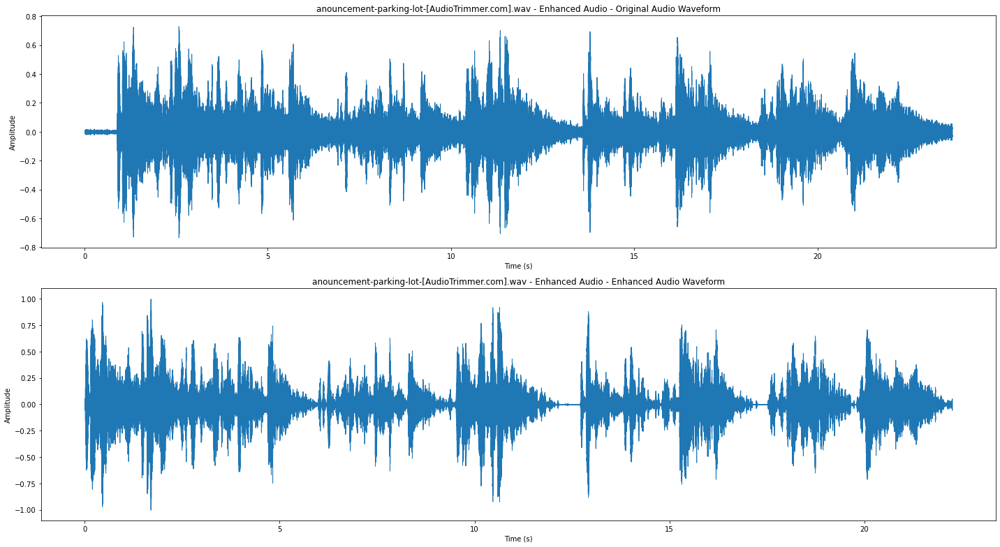

Waveform: This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.


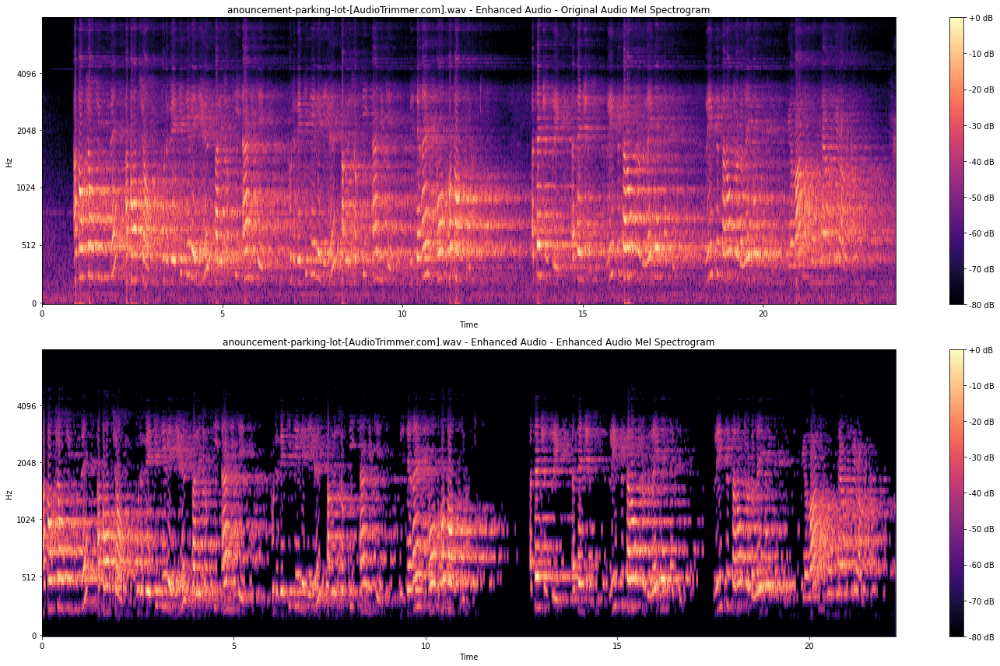

Mel Spectrogram: This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.


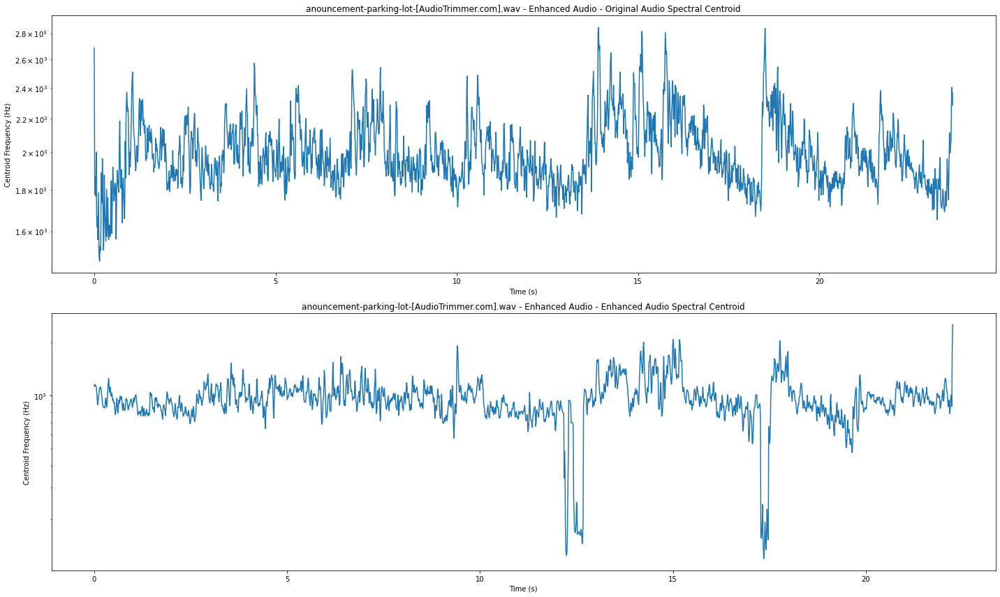

Spectral Centroid: The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.


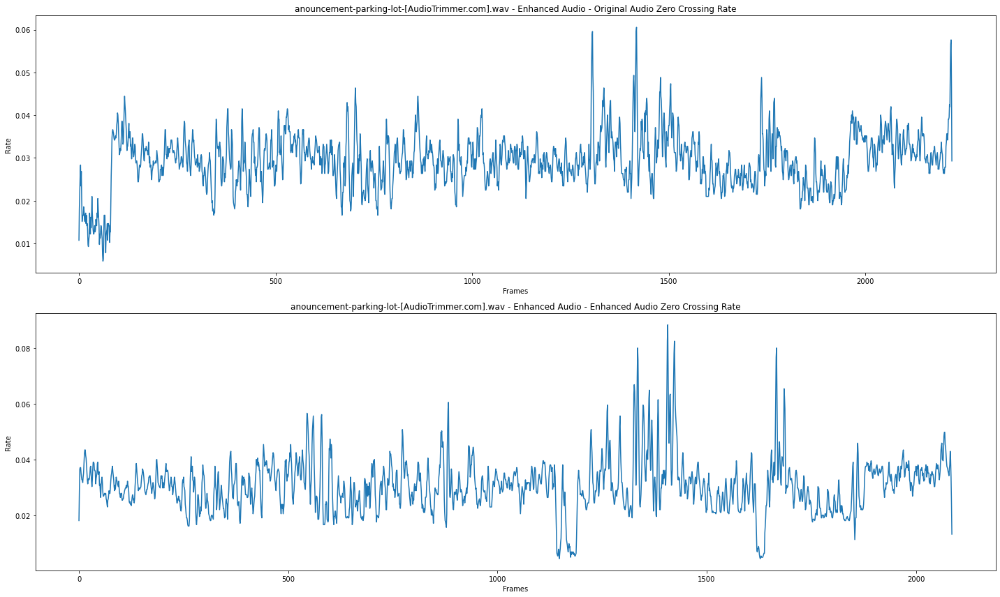

Zero Crossing Rate: This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.
Processing file: leave-me-to-this-battle-no-reverb.wav


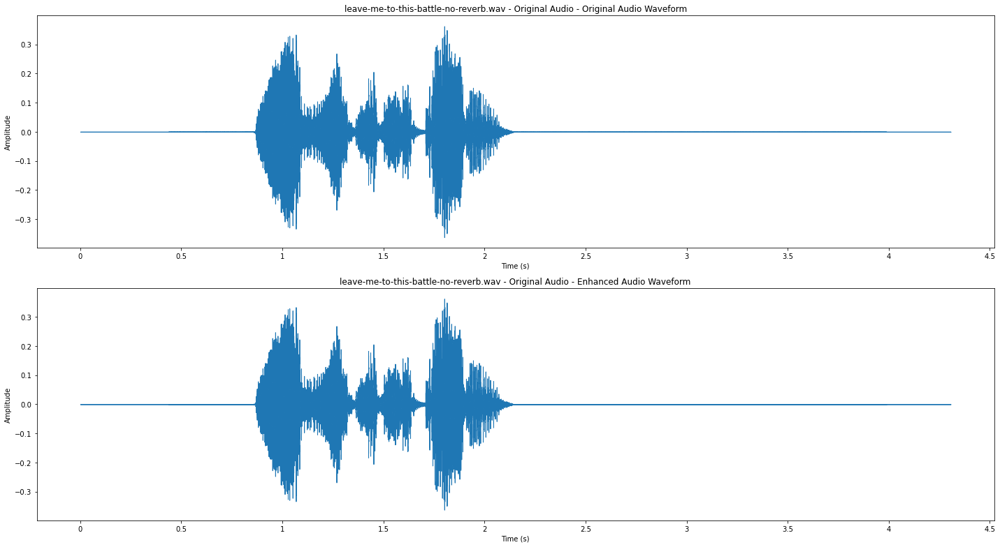

Waveform: This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.


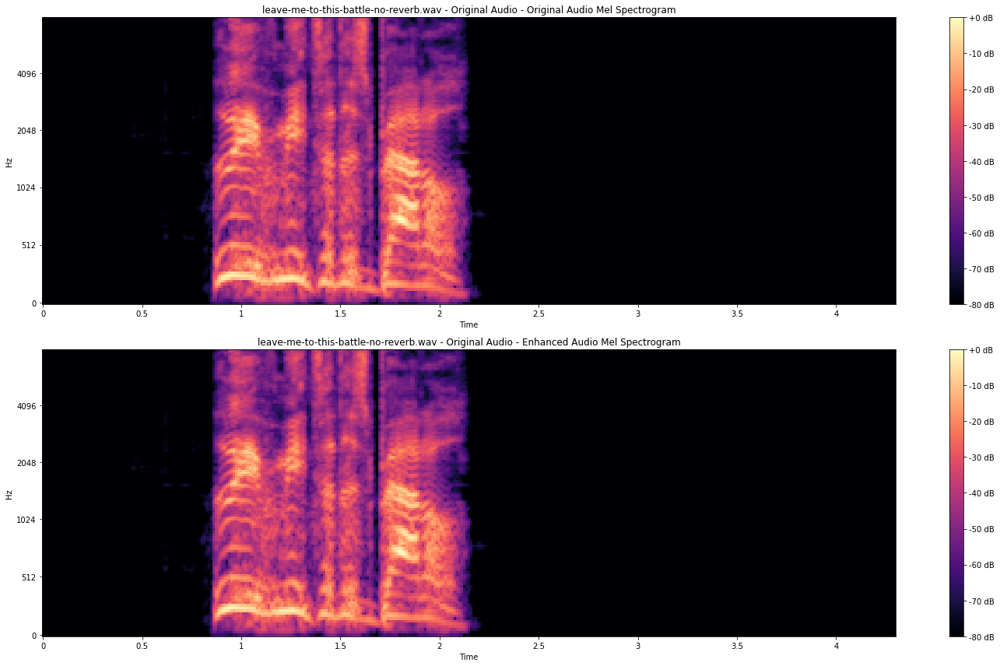

Mel Spectrogram: This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.


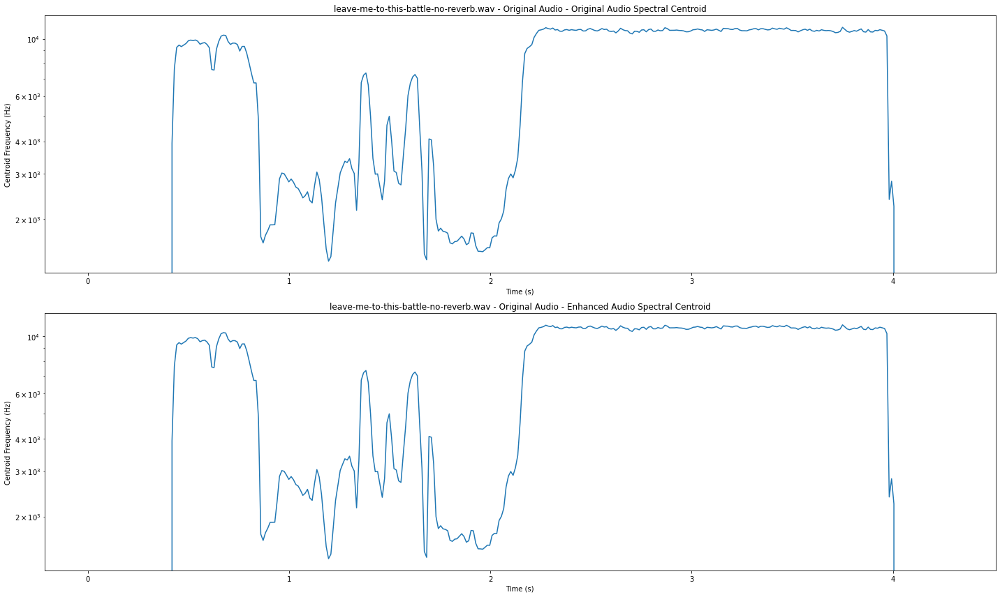

Spectral Centroid: The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.


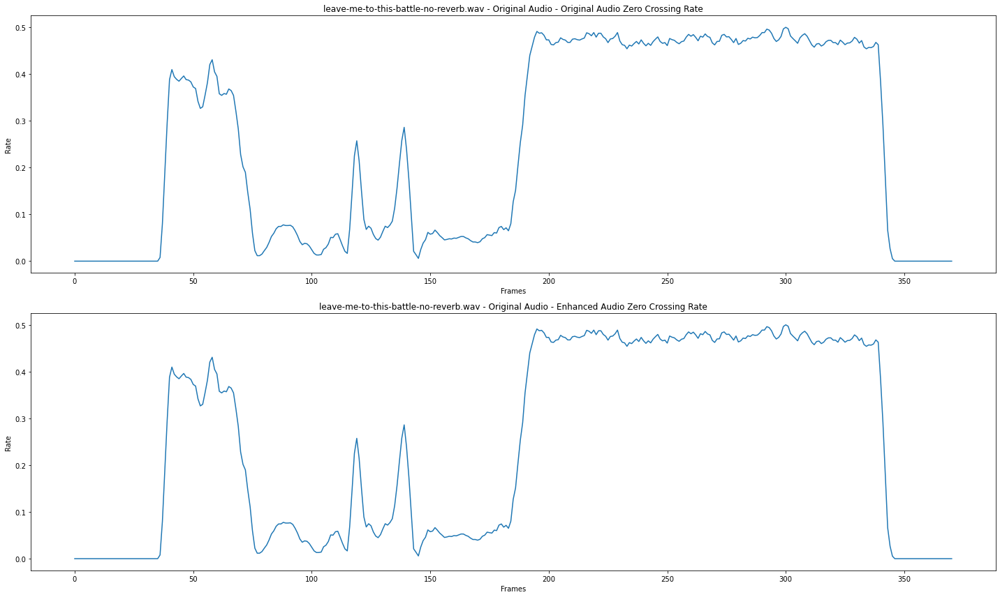

Zero Crossing Rate: This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.
Enhanced audio saved as leave-me-to-this-battle-no-reverb_enhanced.wav.


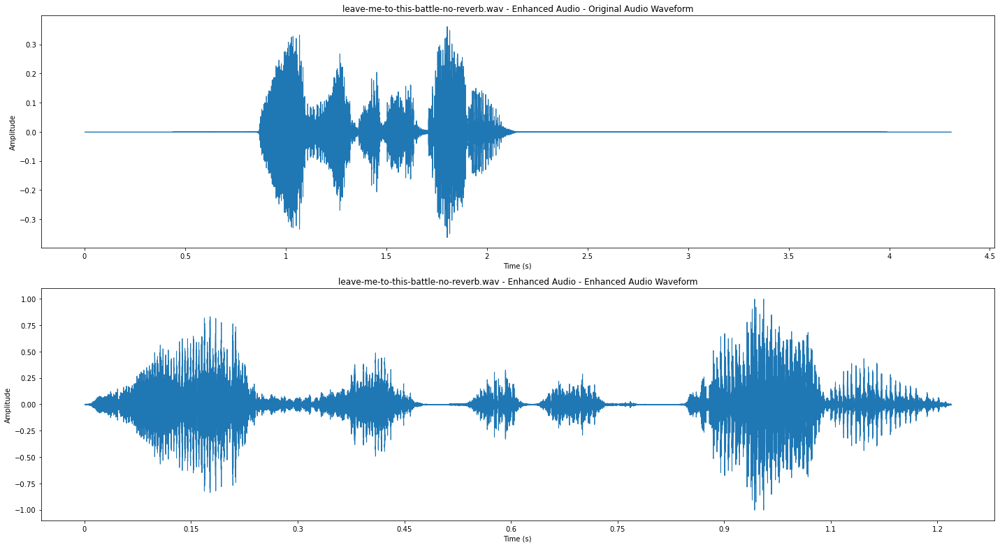

Waveform: This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.


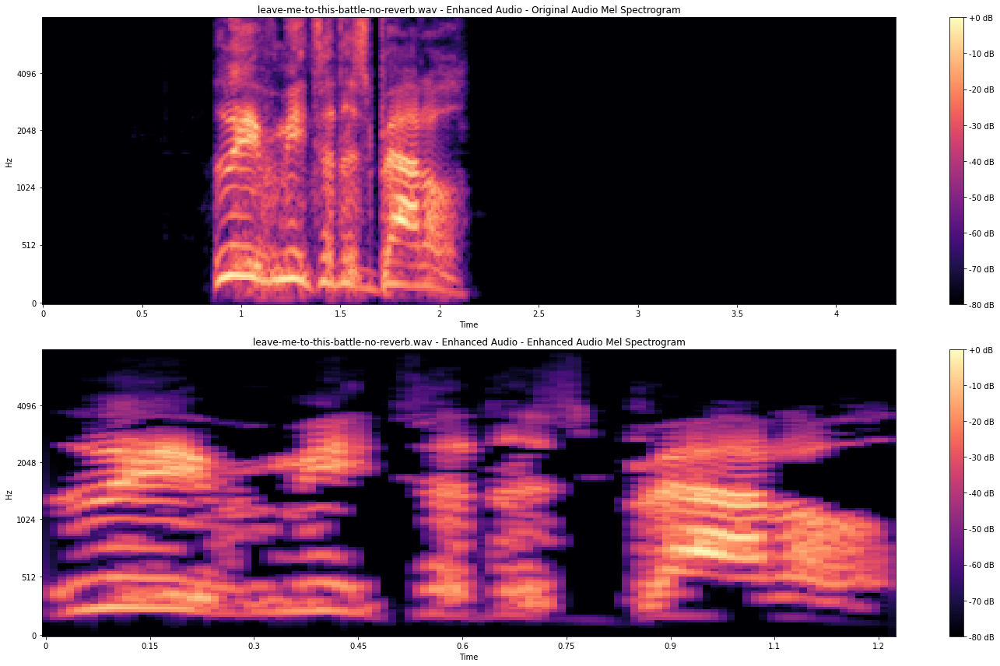

Mel Spectrogram: This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.


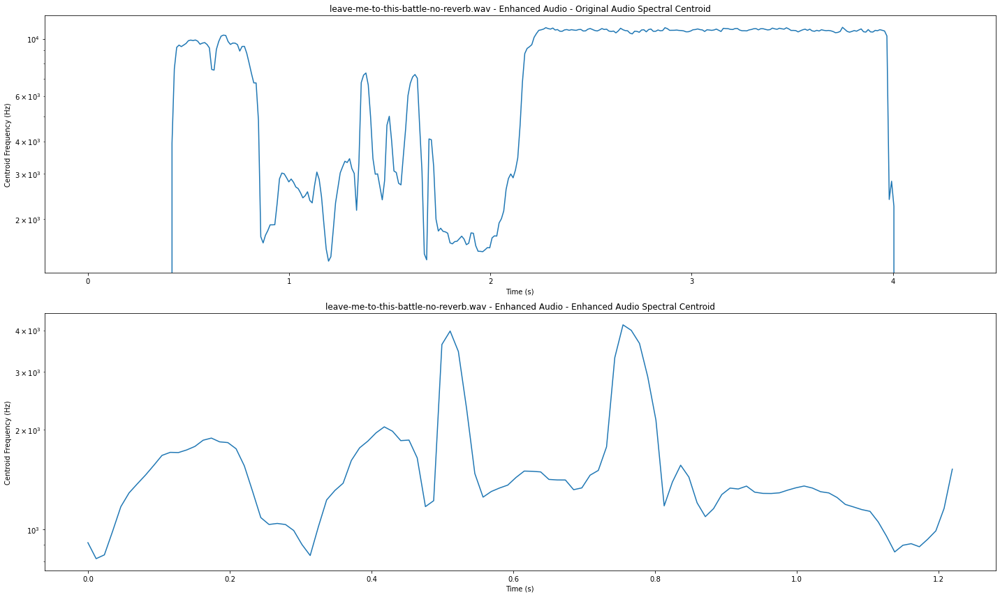

Spectral Centroid: The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.


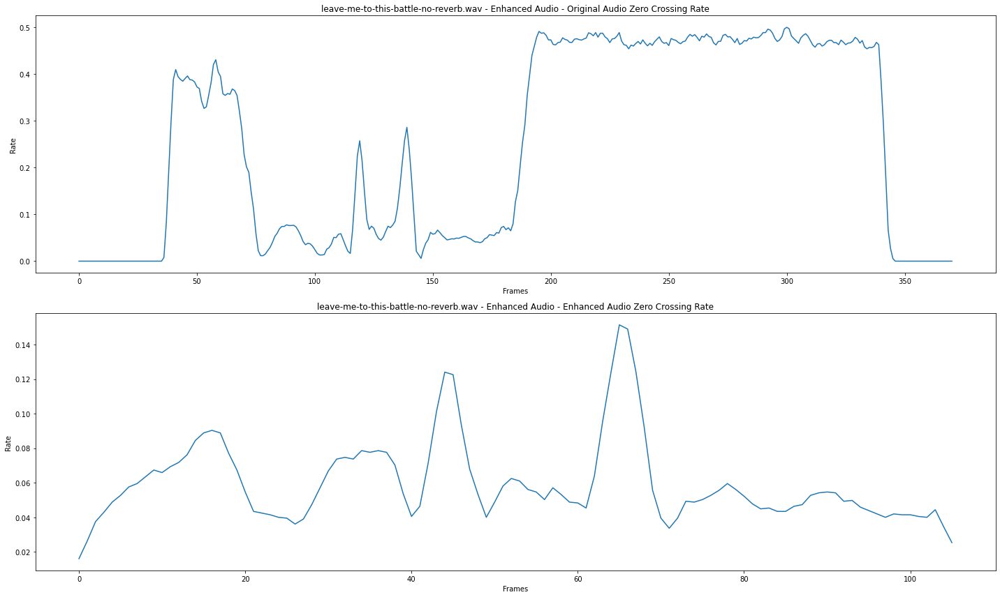

Zero Crossing Rate: This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.
Processing file: test-weatherreport2-[AudioTrimmer.com].wav


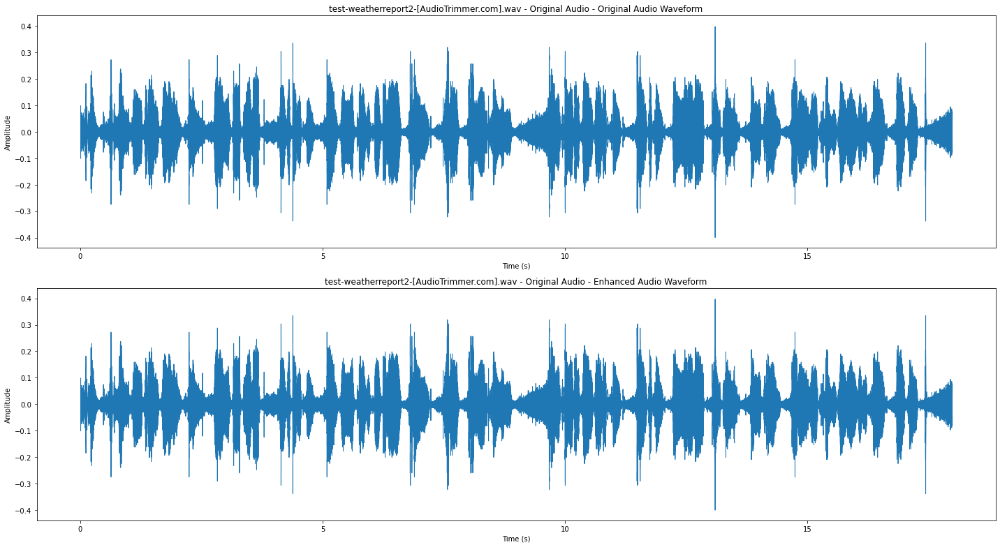

Waveform: This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.


C:\Users\yugesh\anaconda3\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


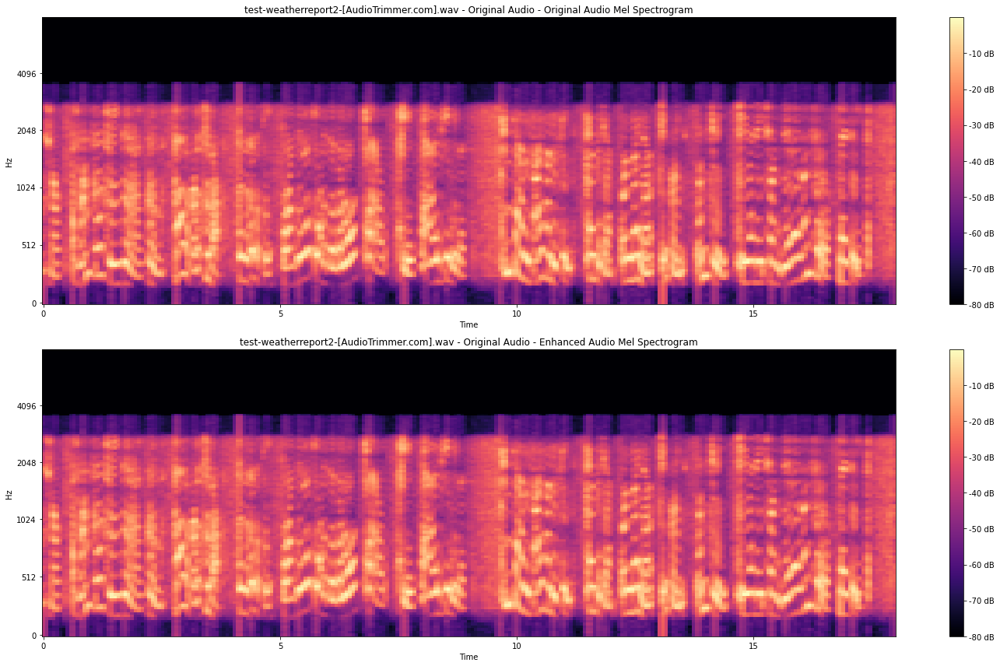

Mel Spectrogram: This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.


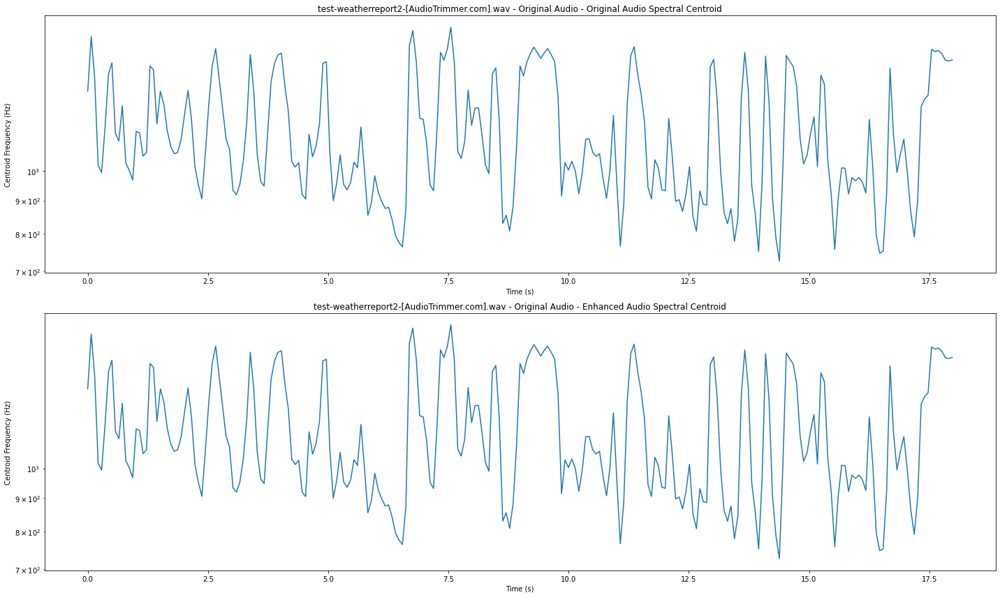

Spectral Centroid: The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.


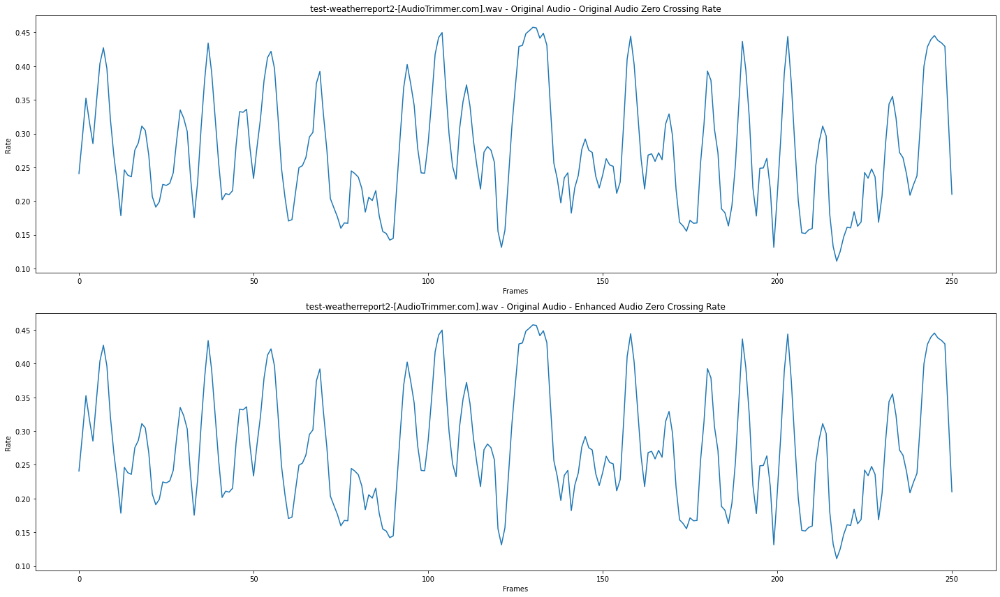

Zero Crossing Rate: This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.
Enhanced audio saved as test-weatherreport2-[AudioTrimmer.com]_enhanced.wav.


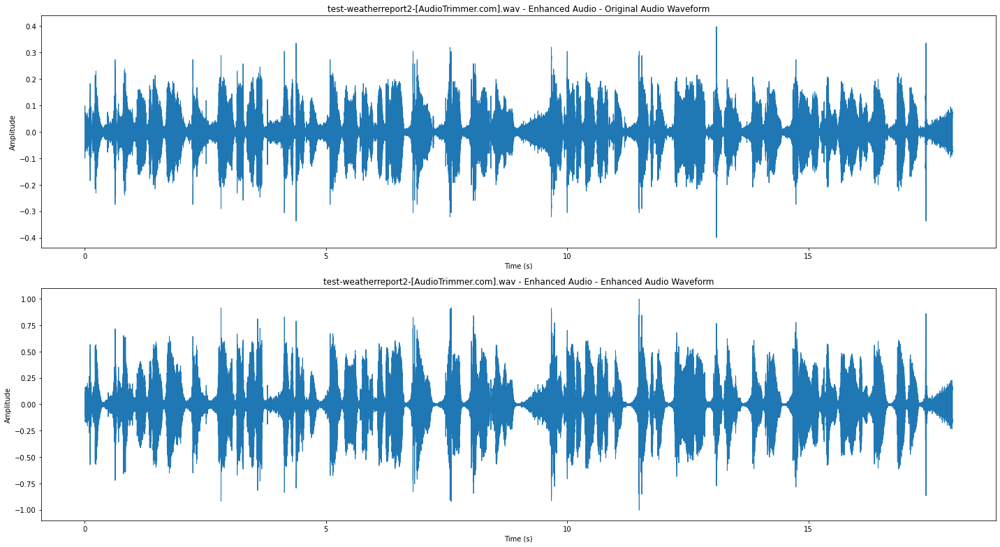

Waveform: This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.


C:\Users\yugesh\anaconda3\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


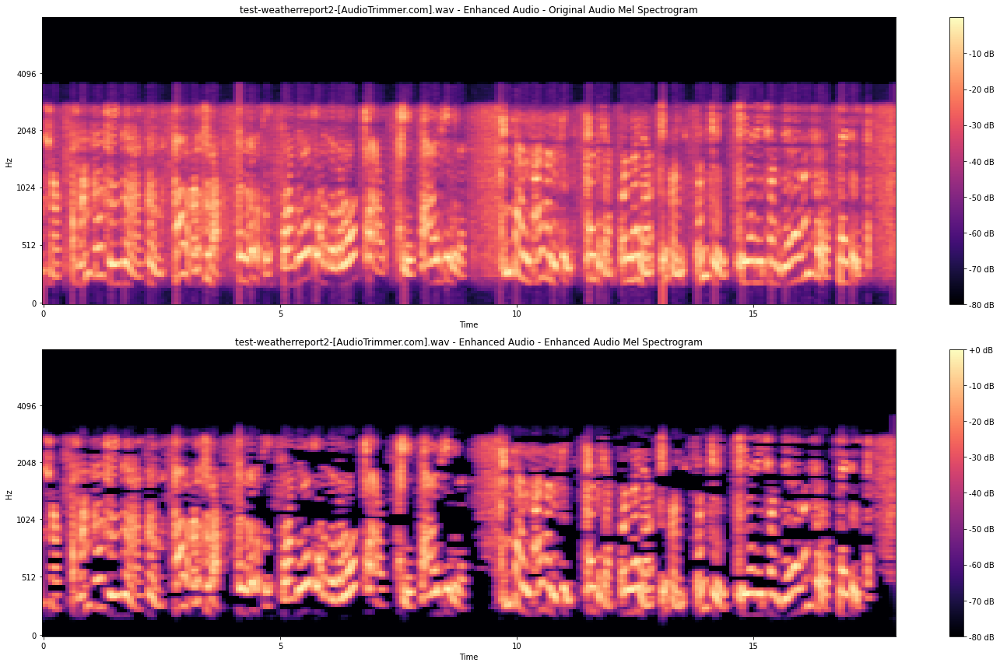

Mel Spectrogram: This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.


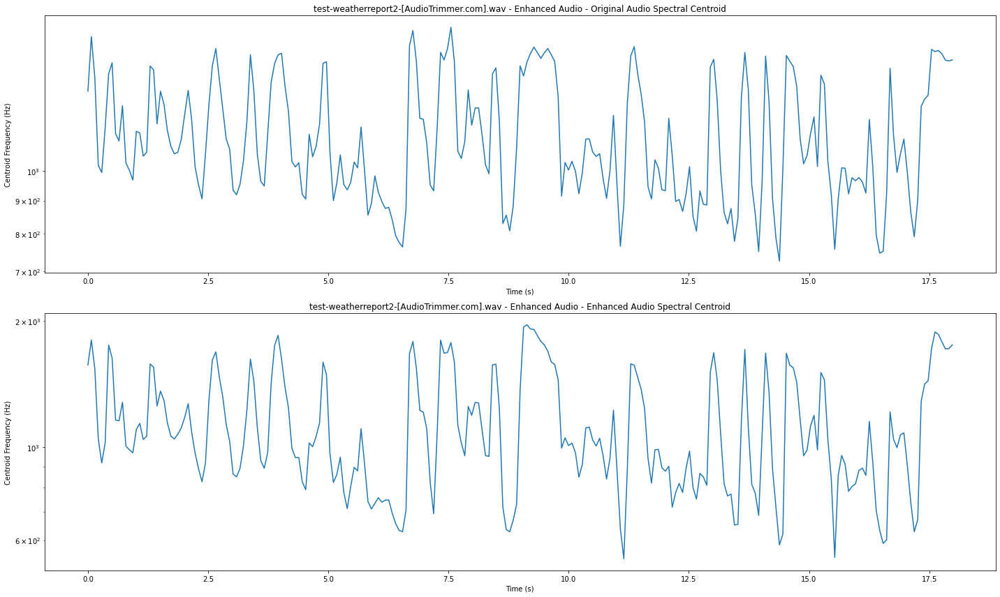

Spectral Centroid: The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.


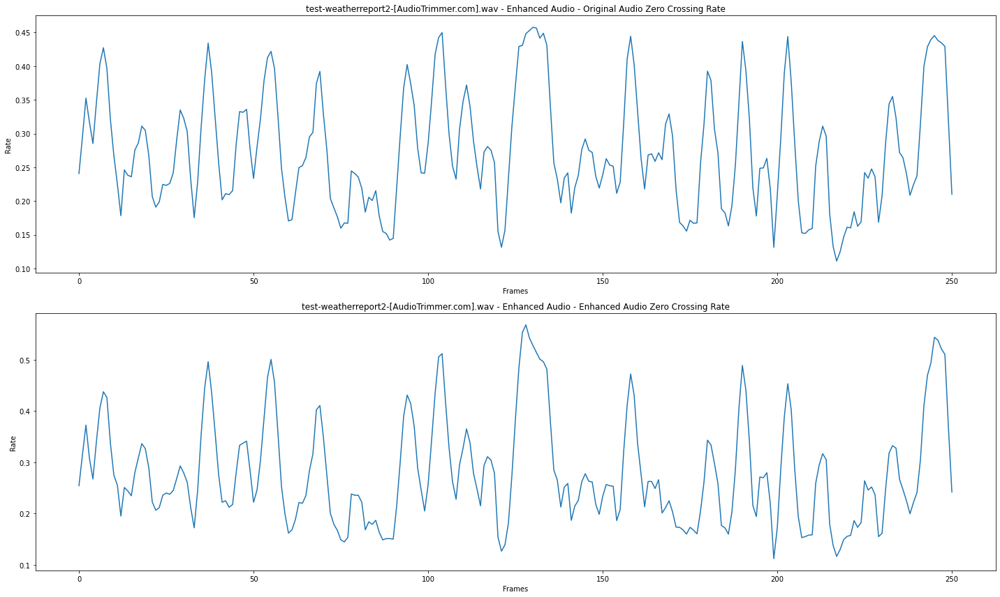

Zero Crossing Rate: This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.


In [66]:
#multiple files selected with graph representation

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
from IPython.display import Audio, display
import ipywidgets as widgets
from io import BytesIO
from scipy.signal import butter, lfilter
import noisereduce as nr


# Band-pass filter function
def band_pass_filter(data, lowcut, highcut, fs, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return lfilter(b, a, data)

# Noise Reduction Function
def reduce_noise(audio, sr, n_fft=2048, hop_length=512):
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    magnitude, phase = librosa.magphase(stft)
    spectral_magnitude = librosa.amplitude_to_db(np.abs(magnitude), ref=np.max)
    spectral_median = np.median(spectral_magnitude, axis=1, keepdims=True)
    noise_threshold = spectral_median + 5  # Dynamic threshold
    mask = spectral_magnitude > noise_threshold
    reduced_spectral_magnitude = magnitude * mask
    reduced_audio = librosa.istft(reduced_spectral_magnitude * phase, hop_length=hop_length)
    return reduced_audio

# Function to trim trailing silence
def trim_silence(audio, sr, top_db=20):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio

# Function to extract features
def extract_features(audio, sr):
    zcr = librosa.feature.zero_crossing_rate(audio)[0]
    rms = librosa.feature.rms(y=audio)[0]
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=audio, sr=sr)[0]
    return zcr, rms, spectral_bandwidth

# Function to plot features with descriptions
def plot_comparative_audio_features(original_audio, enhanced_audio, sr, title_prefix):

    feature_descriptions = {
        "Waveform": "This chart represents the amplitude variations over time. It shows the loudness dynamics and structure of the audio.",
        "Mel Spectrogram": "This spectrogram visualizes the frequency content over time, with intensity representing the strength of different frequency components.",
        "Spectral Centroid": "The spectral centroid indicates the 'center of mass' of the frequency spectrum, providing an idea of where most energy is concentrated.",
        "Zero Crossing Rate": "This measures the rate at which the audio waveform crosses the zero amplitude level, which correlates with its noisiness or percussiveness.",
        "Spectral Bandwidth": "This measures the width of the frequency spectrum, indicating the range of frequencies present in the audio."
    }

    # Waveform
    plt.figure(figsize=(20, 11))
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(original_audio, sr=sr)
    plt.title(f'{title_prefix} - Original Audio Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.subplot(2, 1, 2)
    librosa.display.waveshow(enhanced_audio, sr=sr)
    plt.title(f'{title_prefix} - Enhanced Audio Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
    print(f"Waveform: {feature_descriptions['Waveform']}")

    # Mel Spectrogram
    plt.figure(figsize=(20, 12))
    plt.subplot(2, 1, 1)
    mel_spec_orig = librosa.feature.melspectrogram(y=original_audio, sr=sr, n_mels=128, fmax=8000)
    mel_spec_db_orig = librosa.power_to_db(mel_spec_orig, ref=np.max)
    librosa.display.specshow(mel_spec_db_orig, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{title_prefix} - Original Audio Mel Spectrogram')
    plt.subplot(2, 1, 2)
    mel_spec_enh = librosa.feature.melspectrogram(y=enhanced_audio, sr=sr, n_mels=128, fmax=8000)
    mel_spec_db_enh = librosa.power_to_db(mel_spec_enh, ref=np.max)
    librosa.display.specshow(mel_spec_db_enh, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{title_prefix} - Enhanced Audio Mel Spectrogram')
    plt.tight_layout()
    plt.show()
    print(f"Mel Spectrogram: {feature_descriptions['Mel Spectrogram']}")

    # Spectral Centroid
    plt.figure(figsize=(20, 12))
    plt.subplot(2, 1, 1)
    spectral_centroids_orig = librosa.feature.spectral_centroid(y=original_audio, sr=sr)[0]
    t_orig = librosa.frames_to_time(range(len(spectral_centroids_orig)), sr=sr)
    plt.semilogy(t_orig, spectral_centroids_orig)
    plt.title(f'{title_prefix} - Original Audio Spectral Centroid')
    plt.xlabel('Time (s)')
    plt.ylabel('Centroid Frequency (Hz)')
    plt.subplot(2, 1, 2)
    spectral_centroids_enh = librosa.feature.spectral_centroid(y=enhanced_audio, sr=sr)[0]
    t_enh = librosa.frames_to_time(range(len(spectral_centroids_enh)), sr=sr)
    plt.semilogy(t_enh, spectral_centroids_enh)
    plt.title(f'{title_prefix} - Enhanced Audio Spectral Centroid')
    plt.xlabel('Time (s)')
    plt.ylabel('Centroid Frequency (Hz)')
    plt.tight_layout()
    plt.show()
    print(f"Spectral Centroid: {feature_descriptions['Spectral Centroid']}")


    # Zero Crossing Rate
    plt.figure(figsize=(20, 12))
    plt.subplot(2, 1, 1)
    zcr_orig = librosa.feature.zero_crossing_rate(original_audio)[0]
    plt.plot(zcr_orig)
    plt.title(f'{title_prefix} - Original Audio Zero Crossing Rate')
    plt.xlabel('Frames')
    plt.ylabel('Rate')
    plt.subplot(2, 1, 2)
    zcr_enh = librosa.feature.zero_crossing_rate(enhanced_audio)[0]
    plt.plot(zcr_enh)
    plt.title(f'{title_prefix} - Enhanced Audio Zero Crossing Rate')
    plt.xlabel('Frames')
    plt.ylabel('Rate')
    plt.tight_layout()
    plt.show()
    print(f"Zero Crossing Rate: {feature_descriptions['Zero Crossing Rate']}")


# Function to process uploaded audio files
def process_uploaded_audio(uploaded_files):
    for file_name, file_content in uploaded_files.items():
        y, sr = librosa.load(BytesIO(file_content['content']), sr=None)
        print(f"Processing file: {file_name}")
        display(Audio(data=y, rate=sr))
        plot_comparative_audio_features(y, y, sr, title_prefix=f'{file_name} - Original Audio')

        # Trim silence and reduce noise
        y_trimmed = trim_silence(y, sr)
        denoised_audio = reduce_noise(y_trimmed, sr)
        denoised_audio = librosa.util.normalize(denoised_audio)

        # Apply band-pass filter
        filtered_audio = band_pass_filter(denoised_audio, lowcut=300, highcut=3000, fs=sr)

        # Normalize final output
        final_audio = librosa.util.normalize(filtered_audio)

        # Save preprocessed audio
        preprocessed_audio_path = file_name.replace(".wav", "_enhanced.wav")
        sf.write(preprocessed_audio_path, final_audio, sr)
        print(f"Enhanced audio saved as {preprocessed_audio_path}.")
        display(Audio(data=final_audio, rate=sr))
        plot_comparative_audio_features(y, final_audio, sr, title_prefix=f'{file_name} - Enhanced Audio')

# File upload widget
upload_widget = widgets.FileUpload(accept='.wav', multiple=True)
display(upload_widget)

def on_upload_change(change):
    if change['new']:
        uploaded_files = {file_name: file for file_name, file in upload_widget.value.items()}
        process_uploaded_audio(uploaded_files)

upload_widget.observe(on_upload_change, names='value')


In [1]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
from IPython.display import display
import ipywidgets as widgets
from io import BytesIO
from scipy.signal import butter, lfilter
import noisereduce as nr
from reportlab.platypus import SimpleDocTemplate, Image, Paragraph, Spacer
from reportlab.lib.pagesizes import letter
from reportlab.lib.styles import getSampleStyleSheet
import smtplib
from email.mime.multipart import MIMEMultipart
from email.mime.base import MIMEBase
from email import encoders

# Band-pass filter function
def band_pass_filter(data, lowcut, highcut, fs, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return lfilter(b, a, data)

# Noise Reduction Function
def reduce_noise(audio, sr, n_fft=2048, hop_length=512):
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    magnitude, phase = librosa.magphase(stft)
    spectral_magnitude = librosa.amplitude_to_db(np.abs(magnitude), ref=np.max)
    spectral_median = np.median(spectral_magnitude, axis=1, keepdims=True)
    noise_threshold = spectral_median + 5  # Dynamic threshold
    mask = spectral_magnitude > noise_threshold
    reduced_spectral_magnitude = magnitude * mask
    reduced_audio = librosa.istft(reduced_spectral_magnitude * phase, hop_length=hop_length)
    return reduced_audio

# Function to trim trailing silence
def trim_silence(audio, sr, top_db=20):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio

# Function to save plots as images
def save_plot_as_image(fig, filename):
    fig.savefig(filename)
    plt.close(fig)

# Function to create PDF
def create_pdf(graphs_and_descriptions, output_pdf_path):
    doc = SimpleDocTemplate(output_pdf_path, pagesize=letter)
    elements = []
    styles = getSampleStyleSheet()

    for image_path, description in graphs_and_descriptions:
        elements.append(Image(image_path, width=400, height=300))
        elements.append(Spacer(1, 12))
        elements.append(Paragraph(description, styles['BodyText']))
        elements.append(Spacer(1, 24))

    doc.build(elements)

# Function to send email
def send_email_with_pdf(recipient_email, pdf_path):
    sender_email = "yugee03@gmail.com"  # Replace with your email
    sender_password = "qgtz ohkr joal qced"  # Replace with your password

    msg = MIMEMultipart()
    msg['From'] = sender_email
    msg['To'] = recipient_email
    msg['Subject'] = "Audio Analysis Report"
    try:
        
        with open(pdf_path, "rb") as attachment:
            part = MIMEBase("application", "octet-stream")
            part.set_payload(attachment.read())
            encoders.encode_base64(part)
            part.add_header(
                "Content-Disposition",
                f"attachment; filename={pdf_path}",
            )
            msg.attach(part)

        with smtplib.SMTP_SSL("smtp.gmail.com", 465) as server:
            server.login(sender_email, sender_password)
            server.send_message(msg)
        return "Email sent successfully!"

    except Exception as e:
        return f"Failed to send email. Error: {str(e)}"    

# Generate analysis plots function
def generate_analysis_plots(y, sr, file_name, description_prefix=""):
    graphs_and_descriptions = []

    # Waveform plot
    fig_waveform = plt.figure()
    librosa.display.waveshow(y, sr=sr)
    plt.title(f"{description_prefix} Audio Waveform: {file_name}")
    save_plot_as_image(fig_waveform, f"waveform_{file_name}.png")
    graphs_and_descriptions.append((f"waveform_{file_name}.png", f"Waveform for {description_prefix} {file_name}"))

    # Mel Spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
    fig_mel = plt.figure()
    librosa.display.specshow(librosa.power_to_db(mel_spectrogram, ref=np.max), y_axis='mel', x_axis='time')
    plt.title(f"{description_prefix} Mel Spectrogram: {file_name}")
    save_plot_as_image(fig_mel, f"mel_spectrogram_{file_name}.png")
    graphs_and_descriptions.append((f"mel_spectrogram_{file_name}.png", f"Mel Spectrogram for {description_prefix} {file_name}"))

    # Spectral Centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
    fig_centroid = plt.figure()
    plt.semilogy(spectral_centroid.T, label='Spectral Centroid')
    plt.ylabel('Spectral Centroid (Hz)')
    plt.xticks([])
    plt.xlim([0, spectral_centroid.shape[-1]])
    plt.title(f"{description_prefix} Spectral Centroid: {file_name}")
    save_plot_as_image(fig_centroid, f"spectral_centroid_{file_name}.png")
    graphs_and_descriptions.append((f"spectral_centroid_{file_name}.png", f"Spectral Centroid for {description_prefix} {file_name}"))

    # Amplitude Envelope
    envelope = np.abs(librosa.onset.onset_strength(y=y, sr=sr))
    fig_envelope = plt.figure()
    plt.plot(envelope, label='Amplitude Envelope')
    plt.title(f"{description_prefix} Amplitude Envelope: {file_name}")
    save_plot_as_image(fig_envelope, f"amplitude_envelope_{file_name}.png")
    graphs_and_descriptions.append((f"amplitude_envelope_{file_name}.png", f"Amplitude Envelope for {description_prefix} {file_name}"))

    # Zero Crossing Rate
    zero_crossings = librosa.feature.zero_crossing_rate(y=y)
    fig_zero_crossing = plt.figure()
    plt.plot(zero_crossings.T, label='Zero Crossing Rate')
    plt.ylabel('Zero Crossing Rate')
    plt.xticks([])
    plt.xlim([0, zero_crossings.shape[-1]])
    plt.title(f"{description_prefix} Zero Crossing Rate: {file_name}")
    save_plot_as_image(fig_zero_crossing, f"zero_crossing_rate_{file_name}.png")
    graphs_and_descriptions.append((f"zero_crossing_rate_{file_name}.png", f"Zero Crossing Rate for {description_prefix} {file_name}"))

    # RMS Energy
    rms = librosa.feature.rms(y=y)
    fig_rms = plt.figure()
    plt.plot(rms.T, label='RMS Energy')
    plt.ylabel('RMS Energy')
    plt.xticks([])
    plt.xlim([0, rms.shape[-1]])
    plt.title(f"{description_prefix} RMS Energy: {file_name}")
    save_plot_as_image(fig_rms, f"rms_{file_name}.png")
    graphs_and_descriptions.append((f"rms_{file_name}.png", f"RMS Energy for {description_prefix} {file_name}"))

    return graphs_and_descriptions

# Main processing function
def process_uploaded_audio(uploaded_files, recipient_email):
    graphs_and_descriptions = []

    for file_name, file_content in uploaded_files.items():
        y, sr = librosa.load(BytesIO(file_content['content']), sr=None)
        print(f"Processing file: {file_name}")

        # Process original audio
        graphs_and_descriptions.extend(generate_analysis_plots(y, sr, file_name, description_prefix="Original"))

        # Trim silence and reduce noise
        y_trimmed = trim_silence(y, sr)
        denoised_audio = reduce_noise(y_trimmed, sr)
        denoised_audio = librosa.util.normalize(denoised_audio)

        # Apply band-pass filter
        filtered_audio = band_pass_filter(denoised_audio, lowcut=300, highcut=3000, fs=sr)

        # Normalize final output
        final_audio = librosa.util.normalize(filtered_audio)

        # Save preprocessed audio
        preprocessed_audio_path = file_name.replace(".wav", "_enhanced.wav")
        sf.write(preprocessed_audio_path, final_audio, sr)

        # Generate enhanced audio plots
        graphs_and_descriptions.extend(generate_analysis_plots(final_audio, sr, file_name.replace(".wav", "_enhanced.wav"), description_prefix="Enhanced"))

    # Create PDF
    output_pdf_path = "audio_analysis_report.pdf"
    create_pdf(graphs_and_descriptions, output_pdf_path)

    # Send email and get confirmation
    email_status = send_email_with_pdf(recipient_email, output_pdf_path)

    return email_status

# File upload widget
upload_widget = widgets.FileUpload(accept='.wav', multiple=True)
email_input = widgets.Text(placeholder='Enter email address', description='Email:')
process_button = widgets.Button(description="Process and Send")

def on_button_click(b):
    if upload_widget.value and email_input.value:
        uploaded_files = {file_name: file for file_name, file in upload_widget.value.items()}
        email_status = process_uploaded_audio(uploaded_files, email_input.value)
        # Display email status in Jupyter notebook interface
        print(email_status)
process_button.on_click(on_button_click)

display(upload_widget, email_input, process_button)


FileUpload(value={}, accept='.wav', description='Upload', multiple=True)

Text(value='', description='Email:', placeholder='Enter email address')

Button(description='Process and Send', style=ButtonStyle())

Processing file: anouncement-parking-lot-[AudioTrimmer.com].wav
Processing file: leave-me-to-this-battle-no-reverb.wav
Processing file: test-weatherreport2-[AudioTrimmer.com].wav
Email sent successfully!
